# Assignment 3: Histograms, Thresholding and Labeling

In [286]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import NoNorm
from PIL import Image, ImageOps
from skimage import exposure
from skimage.filters import threshold_otsu
from skimage.color import rgb2hsv
from skimage.morphology import remove_small_objects
from skimage.measure import label
from skimage.color import label2rgb

### 1. Histogram 
##### 1.1. Moments 
##### Compute the mean and standard deviation values of an image using mean2 and std2. Compute the median value using median.

In [303]:
image_chro = Image.open("C:\\Users\\sofyc\\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\chro.bmp")
#To array
image_array_chro = np.array(image_chro)

#Since mean2 and std2 are functions from Matlab, we can use here some similar functions from Numpy.
#Mean
mean_chro = np.mean(image_array_chro)
#Standard deviation
std_chro = np.std(image_array_chro)
#Median
median_chro = np.median(image_array_chro)

print(f"Mean of the image chro: {mean_chro:.3f}")
print(f"Standard deviation of the image chro: {std_chro:.3f}")
print(f"Median of the image chro: {median_chro:.3f}")

Mean of the image chro: 112.941
Standard deviation of the image chro: 32.527
Median of the image chro: 100.000


##### 1.2. Vizualization 
##### Using the image chro, imhist permits to visualize its histogram. Change the number of bins to 64 and 16 and see the differences. Use cumsum to create its cumulative histogram. Use plot or bar to display it. How to use the cumulative histogram to obtain the median value? If wanted, try to obtain it using find and max for example directly from the cumulative histogram. Rotate the image with an angle of 90° using rotate function, is the histogram modified? Modify your image with imcomplement and see the influence on the histogram, what is the rule of this function?  

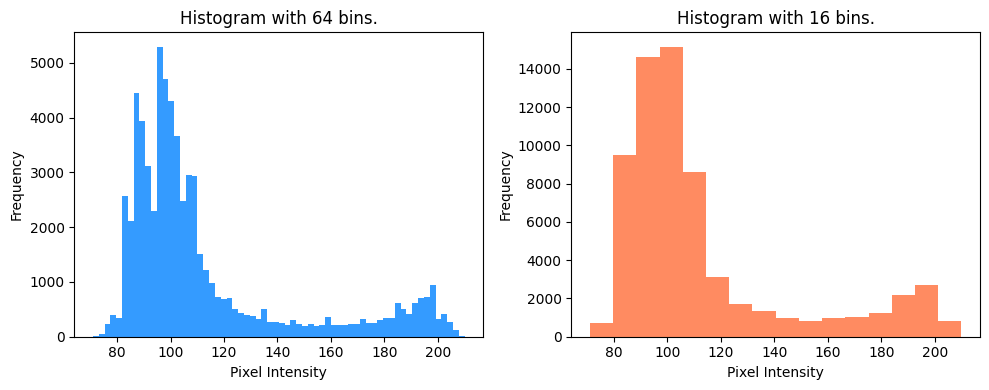

In [304]:
#Plot the histogram
plt.figure(figsize=(10, 4))

#Histogram with 64 bins
plt.subplot(1, 2, 1)
plt.hist(image_array_chro.ravel(), bins=64, color='dodgerblue', alpha=0.9)
plt.title("Histogram with 64 bins.")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

#Histogram with 16 bins
plt.subplot(1, 2, 2)
plt.hist(image_array_chro.ravel(), bins=16, color='coral', alpha=0.9)
plt.title("Histogram with 16 bins.")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


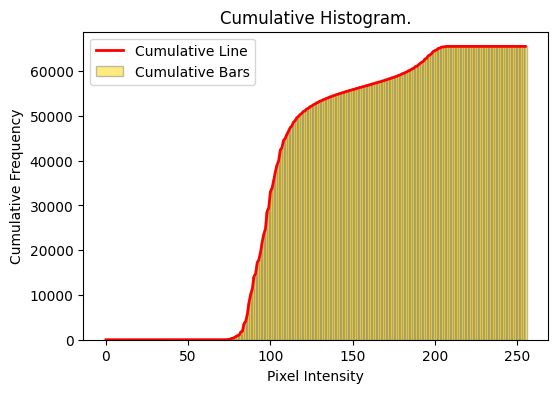

In [306]:
#Cumulative histogram
hist, bins = np.histogram(image_array_chro.ravel(), bins=256, range=(0, 256))
cumulative_hist = np.cumsum(hist)

#Plot
plt.figure(figsize=(6, 4))
#Plot of the bins
plt.bar(
    bins[:-1],
    cumulative_hist,         
    width=2,  #Width of a bin
    color='gold',
    edgecolor='gray',
    alpha=0.5, 
    label='Cumulative Bars'
)

#Cumulative function line
plt.plot(
    bins[:-1], cumulative_hist,
    color='red',
    linewidth=2,
    label='Cumulative Line'
)

plt.title("Cumulative Histogram.")
plt.xlabel("Pixel Intensity")
plt.ylabel("Cumulative Frequency")
plt.legend()

plt.show()

In [307]:
#Obtaining the median value from the cumulative histogram
total_pixels = cumulative_hist[-1]  #Total pixels
median_value = np.where(cumulative_hist >= total_pixels / 2)[0][0]
print(f"Median from the cumulative histogram: {median_value}")

Median from the cumulative histogram: 100


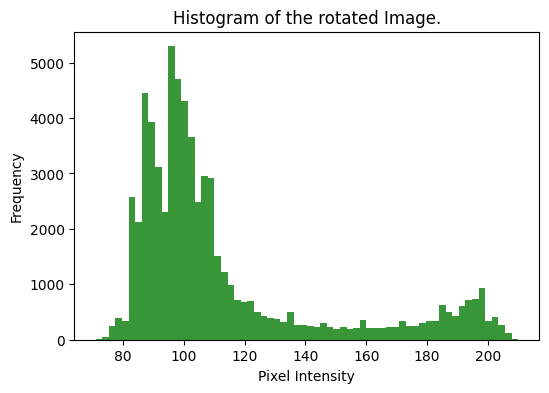

In [309]:
#Image rotation of 90°
rotated_chro = image_chro.rotate(90)
rotated_array_chro = np.array(rotated_chro)

#New histogram
plt.figure(figsize=(6, 4))
plt.hist(rotated_array_chro.ravel(), bins=64, color='forestgreen', alpha=0.9)
plt.title("Histogram of the rotated Image.")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

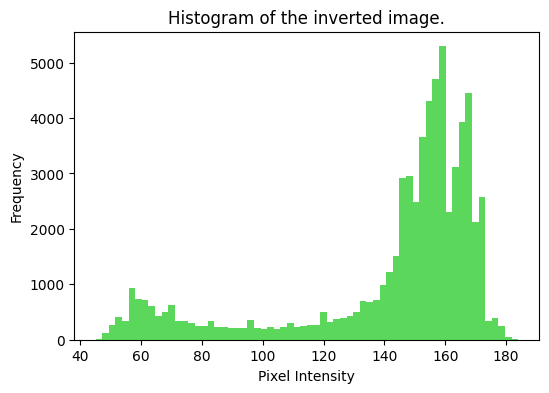

In [ ]:
#Modifying the image with invert function: it inverts the values of the pixels, transforming the bright pizels into dark ones and viceversa.
inverted_chro = ImageOps.invert(image_chro)
inverted_array_chro = np.array(inverted_chro)

#New histogram
plt.figure(figsize=(6, 4))
plt.hist(inverted_array_chro.ravel(), bins=64, color='limegreen', alpha=0.8)
plt.title("Histogram of the inverted image.")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

##### 1.3. Histogram stretching 
##### Implement your own algorithm to realize histogram stretching. Compare with the results obtained directly using skimage, with and without specifying output interval. 

##### $ I(m,n) = (OriginalPixel-Image_{min}) * (\frac{I_{max}-I_{min}}{Image_{max}-Image_{min}}) + I_{min} $
##### $ s = (r-c) * (\frac{b-a}{d-c}) + a $

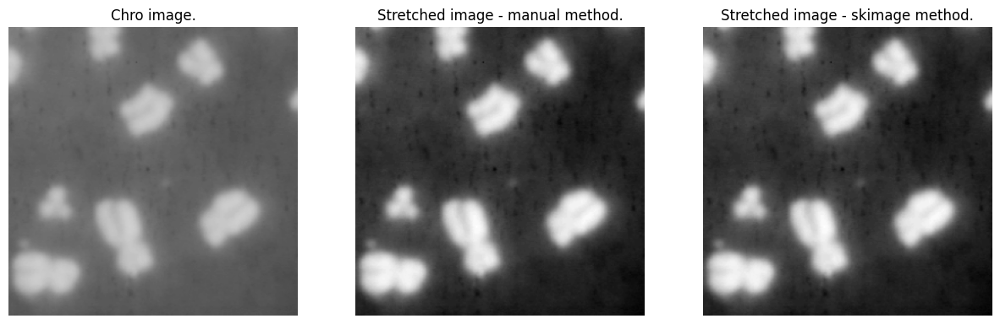

In [312]:
#Function for histogram stretching
def stretching(img):
    ratio = (255-0)/(np.max(image_array_chro) - np.min(image_array_chro))
    s = (img - np.min(img)) * ratio + 0
    return s

#Manual method
stretched_chro = stretching(image_array_chro)

#Skimage method
stretched_skimage = exposure.rescale_intensity(image_array_chro, in_range='image', out_range=(0, 255))

#Plot gray scale
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(image_chro, cmap='gray', norm=NoNorm())
plt.title("Chro image.")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(stretched_chro, cmap='gray')
plt.title("Stretched image - manual method.")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(stretched_skimage, cmap='gray')
plt.title("Stretched image - skimage method.")
plt.axis("off")

plt.show()

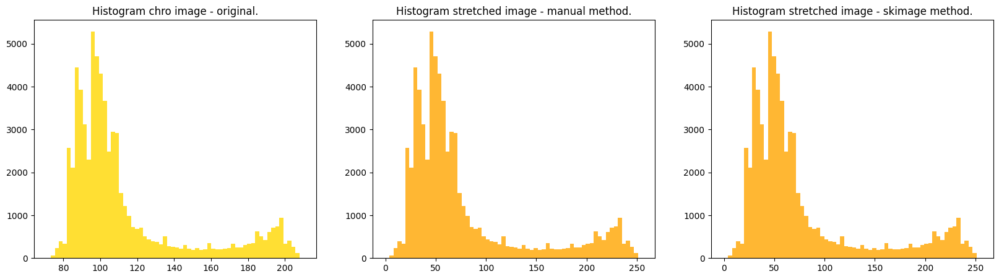

In [ ]:
#Histograms in the three cases
plt.figure(figsize=(20, 5))

#Original image
plt.subplot(1, 3, 1)
plt.hist(image_array_chro.ravel(), bins=64, color='gold', alpha=0.8)
plt.title("Histogram chro image - original.")

#Stretched image - manual method
plt.subplot(1, 3, 2)
plt.hist(stretched_chro.ravel(), bins=64, color='orange', alpha=0.8)
plt.title("Histogram stretched image - manual method.")

#Stretched image - skimage method
plt.subplot(1, 3, 3)
plt.hist(stretched_skimage.ravel(), bins=64, color='orange', alpha=0.8)
plt.title("Histogram stretched image - skimage method.")

plt.show()

#As we see, in the first histogram the range is between 71 and 210. In the stretched ones, the rages are [0,255].

##### 1.4. Histogram equalization 
##### Using the function exposure.equalize_hist from the skimage library, operate all the images ‘elaine*’, and comment the results. Influence on the mean and standard deviations values. Then considering the images ‘neck’ and ‘covering’, is your conclusion similar after equalizing? For the color image ‘rocks’, equalize the R, G and B images separately as previously and convert the images back to jpg format. Comments? What about ‘umbrella’?

(-0.5, 511.5, 511.5, -0.5)

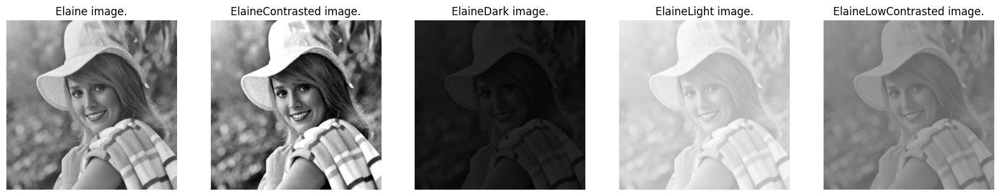

In [ ]:
#Loading the images
image_elaine = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\elaine.jpg")
image_elaineContrasted = Image.open("C:\\Users\\sofyc\\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\elaineContrasted.jpg")
image_elaineDark = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\elaineDark.jpg")
image_elaineLight = Image.open("C:\\Users\\sofyc\\OneDrive\\Desktop\\UPEC\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\elaineLight.jpg")
image_elaineLowContrasted = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\elaineLowContrasted.jpg")

#Plots
plt.figure(figsize=(20, 6))
plt.subplot(1, 5, 1)
plt.imshow(image_elaine, cmap='gray', norm=NoNorm())
plt.title("Elaine image.")
plt.axis("off")

plt.subplot(1,5, 2)
plt.imshow(image_elaineContrasted, cmap='gray', norm=NoNorm())
plt.title("ElaineContrasted image.")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(image_elaineDark, cmap='gray', norm=NoNorm())
plt.title("ElaineDark image.")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(image_elaineLight, cmap='gray', norm=NoNorm())
plt.title("ElaineLight image.")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(image_elaineLowContrasted, cmap='gray', norm=NoNorm())
plt.title("ElaineLowContrasted image.")
plt.axis("off")

(-0.5, 511.5, 511.5, -0.5)

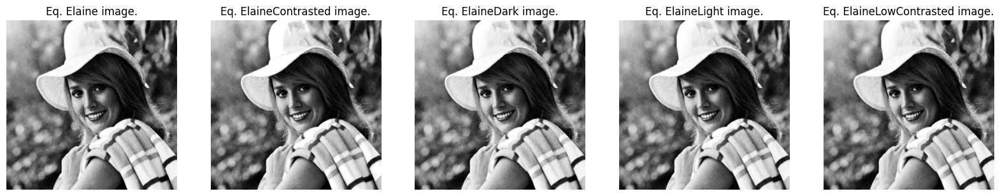

In [314]:
#To array
image_array_elaine = np.array(image_elaine)
image_array_Contrasted = np.array(image_elaineContrasted)
image_array_Dark = np.array(image_elaineDark)
image_array_Light = np.array(image_elaineLight)
image_array_LowContrasted = np.array(image_elaineLowContrasted)

#Applying the function
equalized_elaine = exposure.equalize_hist(image_array_elaine)
equalized_elaineContrasted = exposure.equalize_hist(image_array_Contrasted)
equalized_elaineDark = exposure.equalize_hist(image_array_Dark)
equalized_elaineLight = exposure.equalize_hist(image_array_Light)
equalized_elaineLowContrasted = exposure.equalize_hist(image_array_LowContrasted)

#Plots
plt.figure(figsize=(20, 6))
plt.subplot(1, 5, 1)
plt.imshow(equalized_elaine, cmap='gray', norm=NoNorm())
plt.title("Eq. Elaine image.")
plt.axis("off")

plt.subplot(1,5, 2)
plt.imshow(equalized_elaineContrasted, cmap='gray', norm=NoNorm())
plt.title("Eq. ElaineContrasted image.")
plt.axis("off")

plt.subplot(1, 5, 3)
plt.imshow(equalized_elaineDark, cmap='gray', norm=NoNorm())
plt.title("Eq. ElaineDark image.")
plt.axis("off")

plt.subplot(1, 5, 4)
plt.imshow(equalized_elaineLight, cmap='gray', norm=NoNorm())
plt.title("Eq. ElaineLight image.")
plt.axis("off")

plt.subplot(1, 5, 5)
plt.imshow(equalized_elaineLowContrasted, cmap='gray', norm=NoNorm())
plt.title("Eq. ElaineLowContrasted image.")
plt.axis("off")

In [154]:
#Check differences on the means
mean_el = np.mean(image_elaine)
mean_Contr = np.mean(image_elaineContrasted)
mean_Dark = np.mean(image_elaineDark)
mean_Light = np.mean(image_elaineLight)
mean_LowContr = np.mean(image_elaineLowContrasted)

mean_eq_el = np.mean(equalized_elaine)
mean_eq_Contr = np.mean(equalized_elaineContrasted)
mean_eq_Dark = np.mean(equalized_elaineDark)
mean_eq_Light = np.mean(equalized_elaineLight)
mean_eq_LowContr = np.mean(equalized_elaineLowContrasted)

#Take a look
mean_res = {
    'Image': ['Elaine', 'ElaineContrasted', 'ElaineDark', 'ElaineLight', 'ElaineLowContrasted'],
    'Mean image': [mean_el, mean_Contr, mean_Dark, mean_Light, mean_LowContr],
    'Mean Equalized Image': [mean_eq_el, mean_eq_Contr, mean_eq_Dark, mean_eq_Light, mean_eq_LowContr]
}

mean_res_df = pd.DataFrame(mean_res)
mean_res_df

,Image,Mean image,Mean Equalized Image
0,Elaine,136.354843,0.503001
1,ElaineContrasted,139.455868,0.504514
2,ElaineDark,22.487926,0.517779
3,ElaineLight,214.560787,0.508761
4,ElaineLowContrasted,130.402126,0.509144


In [155]:
#Check differences on the standard deviation
std_el = np.std(image_elaine)
std_Contr = np.std(image_elaineContrasted)
std_Dark = np.std(image_elaineDark)
std_Light = np.std(image_elaineLight)
std_LowContr = np.std(image_elaineLowContrasted)

std_eq_el = np.std(equalized_elaine)
std_eq_Contr = np.std(equalized_elaineContrasted)
std_eq_Dark = np.std(equalized_elaineDark)
std_eq_Light = np.std(equalized_elaineLight)
std_eq_LowContr = np.std(equalized_elaineLowContrasted)

#Take a look
std_res = {
    'Image': ['Elaine', 'ElaineContrasted', 'ElaineDark', 'ElaineLight', 'ElaineLowContrasted'],
    'Std. image': [std_el, std_Contr, std_Dark, std_Light, std_LowContr],
    'Std. Equalized Image': [std_eq_el, std_eq_Contr, std_eq_Dark, std_eq_Light, std_eq_LowContr]
}

std_res_df = pd.DataFrame(std_res)
std_res_df

,Image,Std. image,Std. Equalized Image
0,Elaine,45.921128,0.288613
1,ElaineContrasted,65.183496,0.291405
2,ElaineDark,7.757789,0.288155
3,ElaineLight,15.856192,0.288465
4,ElaineLowContrasted,15.068619,0.288470


(-0.5, 249.5, 218.5, -0.5)

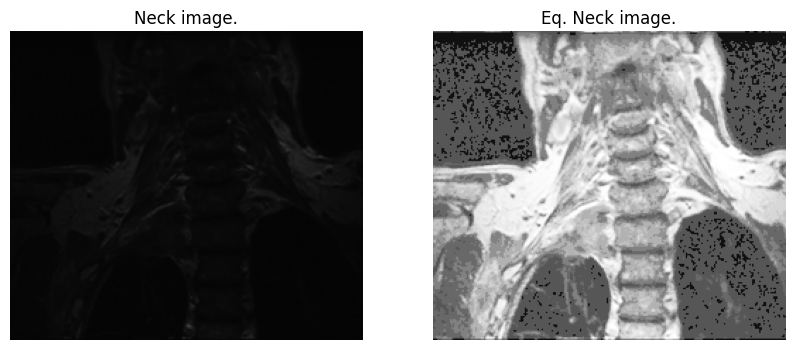

In [315]:
#Load image
image_neck = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\neck.bmp")

#Plot
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_neck, cmap='gray', norm=NoNorm())
plt.title("Neck image.")
plt.axis("off")

#To array
image_array_neck = np.array(image_neck)
#Equalized image
equalized_neck = exposure.equalize_hist(image_array_neck)

#Plot
plt.subplot(1, 2, 2)
plt.imshow(equalized_neck, cmap='gray', norm=NoNorm())
plt.title("Eq. Neck image.")
plt.axis("off")

(-0.5, 152.5, 283.5, -0.5)

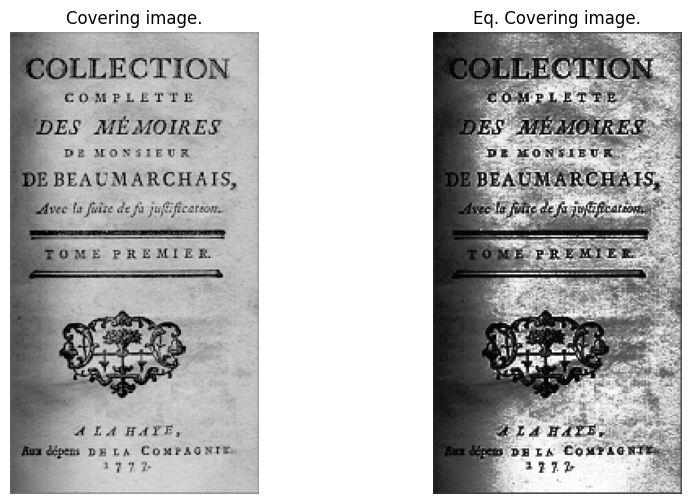

In [316]:
#Load image
image_covering = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\covering.bmp")

#Plot
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_covering, cmap='gray', norm=NoNorm())
plt.title("Covering image.")
plt.axis("off")

#To array
image_array_covering = np.array(image_covering)
#Equalized image
equalized_covering = exposure.equalize_hist(image_array_covering)

#Plot
plt.subplot(1, 2, 2)
plt.imshow(equalized_covering, cmap='gray', norm=NoNorm())
plt.title("Eq. Covering image.")
plt.axis("off")

(-0.5, 696.5, 696.5, -0.5)

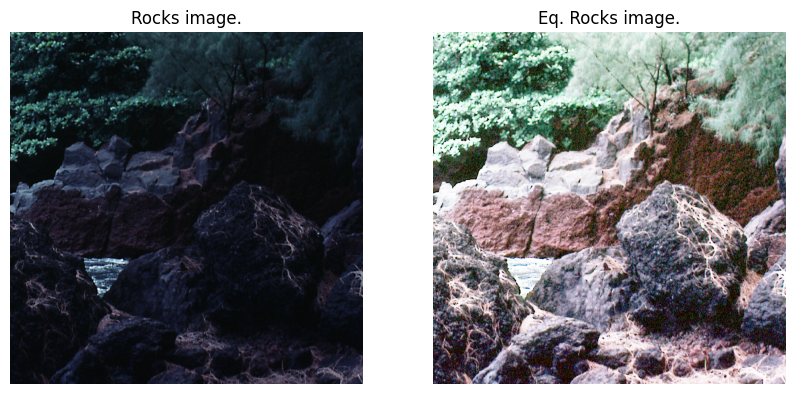

In [317]:
#Loading image
image_rocks = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\rocks.jpg")

#To array
image_array_rocks = np.array(image_rocks)

#Split of the RGB channels
R = image_array_rocks[:, :, 0]
G = image_array_rocks[:, :, 1]
B = image_array_rocks[:, :, 2]

#Equalization for each channel
R_eq_rocks = exposure.equalize_hist(R)
G_eq_rocks = exposure.equalize_hist(G)
B_eq_rocks = exposure.equalize_hist(B)

#Combining the equalized RGB channels
#We basically convert the values from [0,1] to [0,255]
equalized_rocks = np.stack([
    (R_eq_rocks * 255).astype(np.uint8),
    (G_eq_rocks * 255).astype(np.uint8),
    (B_eq_rocks * 255).astype(np.uint8)
], axis=-1)

#Plot
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_rocks)
plt.title("Rocks image.")
plt.axis("off")

#Plot
plt.subplot(1, 2, 2)
plt.imshow(equalized_rocks)
plt.title("Eq. Rocks image.")
plt.axis("off")

(-0.5, 499.5, 499.5, -0.5)

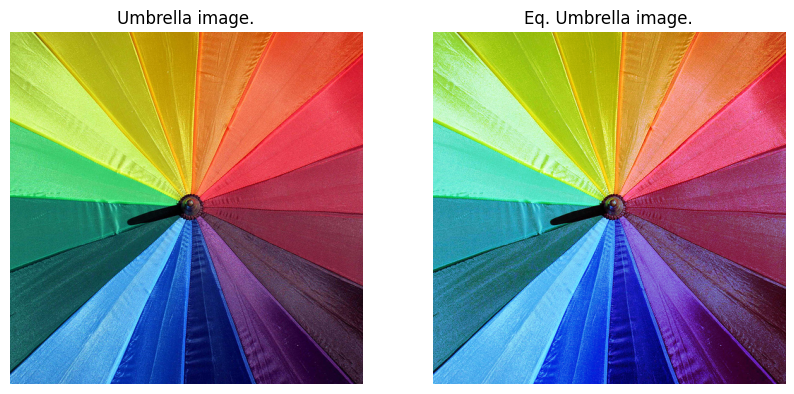

In [318]:
#Loading image
image_umbrella = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 1 - IP\\IP1\\IP1\\umbrella.jpg")

#To array
image_array_umbrella = np.array(image_umbrella)

#Split of the RGB channels
R = image_array_umbrella[:, :, 0]
G = image_array_umbrella[:, :, 1]
B = image_array_umbrella[:, :, 2]

#Equalization for each channel
R_eq_umbrella = exposure.equalize_hist(R)
G_eq_umbrella = exposure.equalize_hist(G)
B_eq_umbrella = exposure.equalize_hist(B)

#Combining the equalized RGB channels
#We basically convert the values from [0,1] to [0,255]
equalized_umbrella = np.stack([
    (R_eq_umbrella * 255).astype(np.uint8),
    (G_eq_umbrella * 255).astype(np.uint8),
    (B_eq_umbrella * 255).astype(np.uint8)
], axis=-1)

#Plot
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_umbrella)
plt.title("Umbrella image.")
plt.axis("off")

#Plot
plt.subplot(1, 2, 2)
plt.imshow(equalized_umbrella)
plt.title("Eq. Umbrella image.")
plt.axis("off")

### 2. Thresholding 
##### 2.1. Manual setting 
##### Considering the image ‘gdr’, try to binarize it using the correct function. Try different values: is there any adapted threshold to isolate each object? Same question with ‘objects’. What is the default value if there is no specification of the level using im2bw?

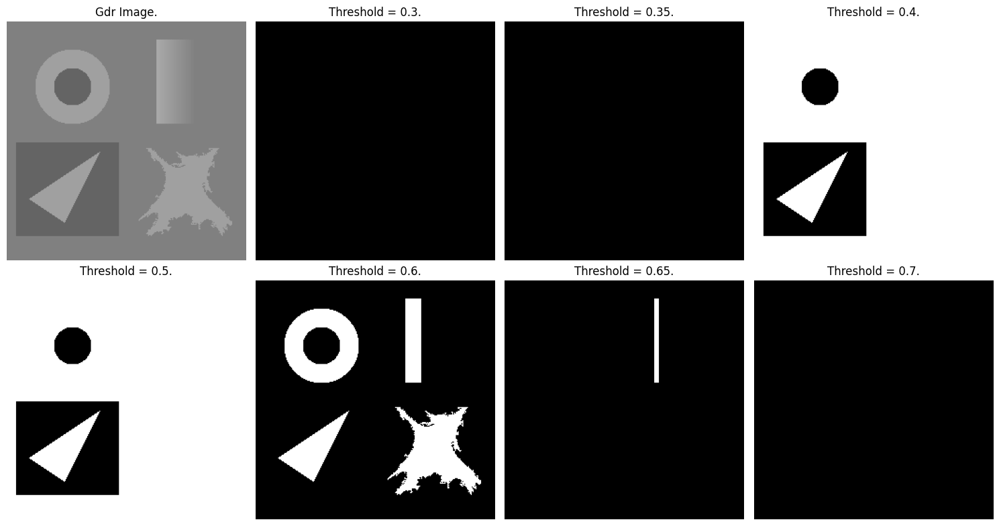

In [319]:
#Loading image
image_gdr = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\gdr.bmp").convert("L") #converting to gray scale

#To array with also the normalization to the scale [0,1]
image_array_gdr = np.array(image_gdr)/255.0

#Thresholding function: the binarization is made putting 1 to pixels > threshold, and 0 to pixels < threshold.
def manual_threshold(img, threshold):
    binary_img = (img > threshold).astype(np.uint8)
    return binary_img

#In the function im2bw of MatLab, the usually default value is 0.5. In this case, we will see the outputs for different values.
#Values for threshold
thresholds = [0.3, 0.35, 0.4, 0.5, 0.6, 0.65, 0.7]

#Plot
#Original image
plt.figure(figsize=(15, 8))
plt.subplot(2, 4, 1)
plt.imshow(image_gdr, cmap='gray', norm=NoNorm())
plt.title("Gdr Image.")
plt.axis("off")
#Thresholded images
for i, thr in enumerate(thresholds):
    binary_img = manual_threshold(image_array_gdr, thr)
    plt.subplot(2, 4, i + 2)
    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Threshold = {thr}.")
    plt.axis("off")

plt.tight_layout()
plt.show()

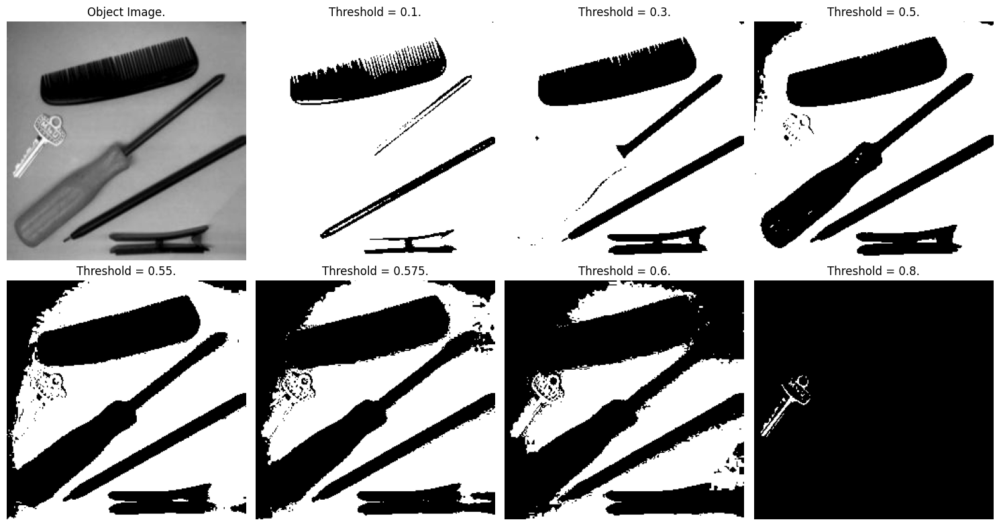

In [320]:
#Loading image
image_objects = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\objects.bmp").convert("L") #converting to gray scale

#To array with also the normalization to the scale [0,1]
image_array_objects = np.array(image_objects) / 255.0

#New values for threshold
thresholds2 = [0.1, 0.3, 0.5, 0.55, 0.575, 0.6, 0.8]

#Plot
#Original image
plt.figure(figsize=(15, 8))
plt.subplot(2, 4, 1)
plt.imshow(image_objects, cmap='gray', norm=NoNorm())
plt.title("Object Image.")
plt.axis("off")
#Thresholded images
for i, thr in enumerate(thresholds2):
    binary_img = manual_threshold(image_array_objects, thr)
    plt.subplot(2, 4, i + 2)
    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Threshold = {thr}.")
    plt.axis("off")

plt.tight_layout()
plt.show()

##### 2.2. Otsu’s method 
##### Taking all the graylevel images (‘gdr’, ‘objects’, ‘bacteria’, ‘cell’, ‘chro’, ‘gear-wheel’, ‘fibers’, ‘fibers2’, ‘I10’, ‘I12’): test the Otsu’s automatic thresholding method (graythreshhold + binary). Analyze the efficiency of the results considering the shape of the histograms. And imagine the images where the binary image seems operated…

In [331]:
#Loading the images
image_bacteria = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\bacteria.jpg").convert("L") #converting to gray scale
image_cell = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\cell.bmp").convert("L") #converting to gray scale
image_gear_wheel = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\gear-wheel.png").convert("L") #converting to gray scale
image_fibers = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\fibers.jpg").convert("L") #converting to gray scale
image_fibers2 = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\fibers2.jpg").convert("L") #converting to gray scale
image_I10 = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\I10.bmp").convert("L") #converting to gray scale
image_I12 = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\I12.bmp").convert("L") #converting to gray scale
image_chro = Image.open("C:\\Users\\sofyc\\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\chro.bmp").convert("L")

#To array with also the normalization to the scale [0,1]
image_array_bacteria = np.array(image_bacteria) / 255.0
image_array_cell = np.array(image_cell) / 255.0
image_array_gear_wheel = np.array(image_gear_wheel) / 255.0
image_array_fibers = np.array(image_fibers) / 255.0
image_array_fibers2 = np.array(image_fibers2) / 255.0
image_array_I10 = np.array(image_I10) / 255.0
image_array_I12 = np.array(image_I12) / 255.0
image_array_chro = np.array(image_chro) / 255.0

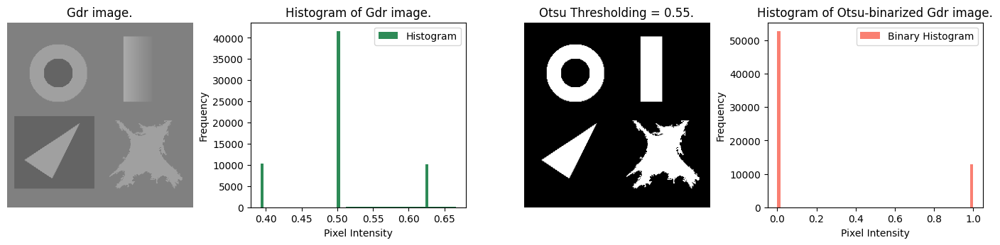

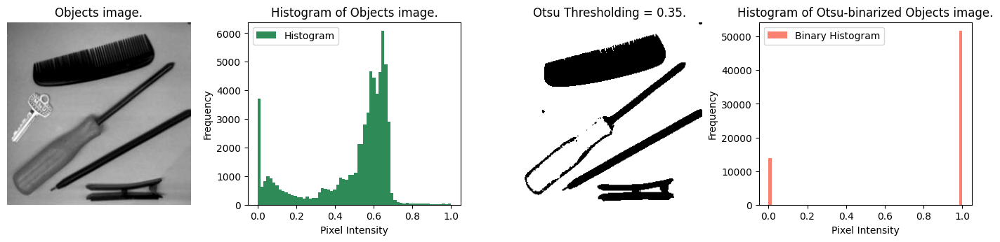

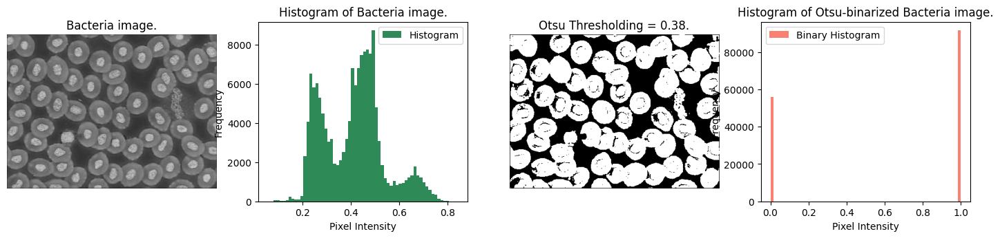

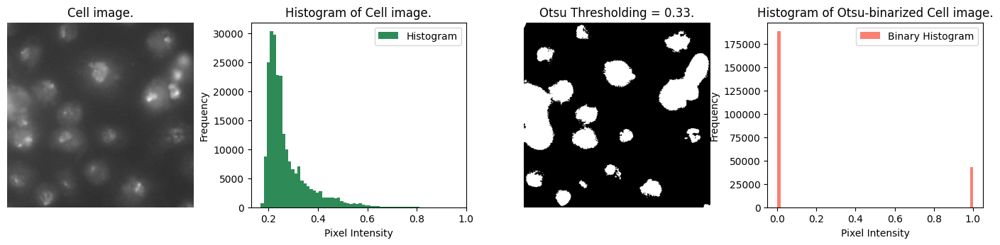

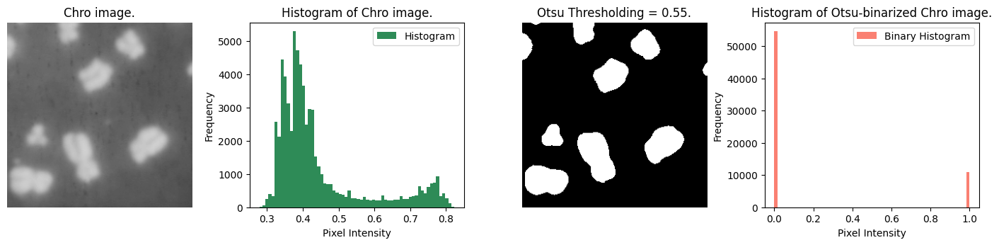

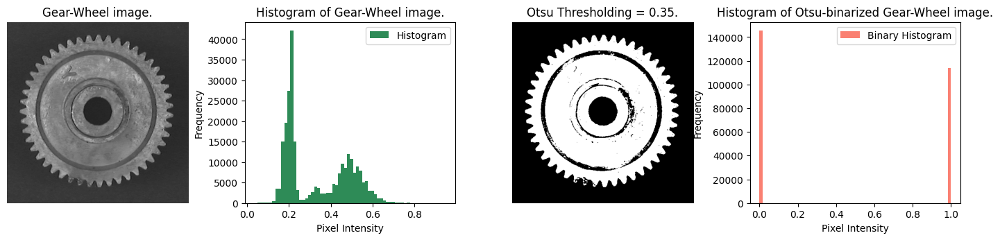

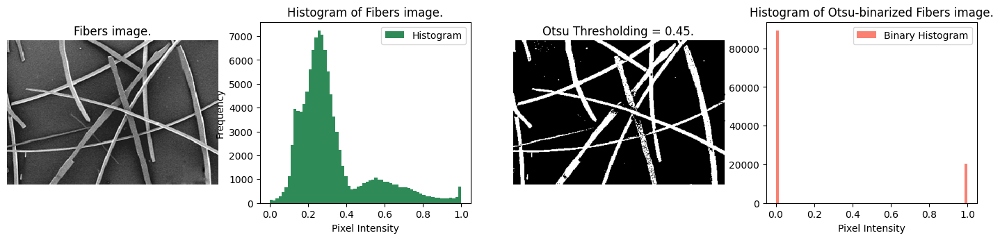

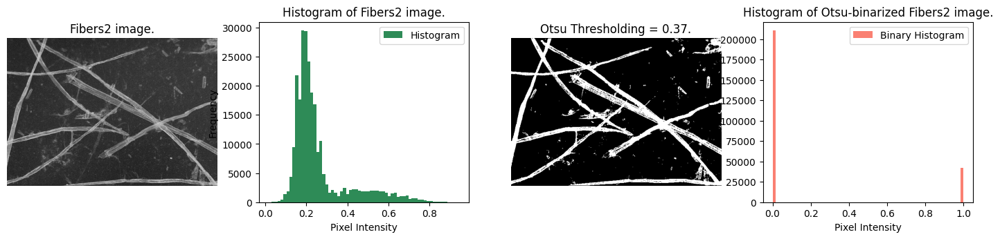

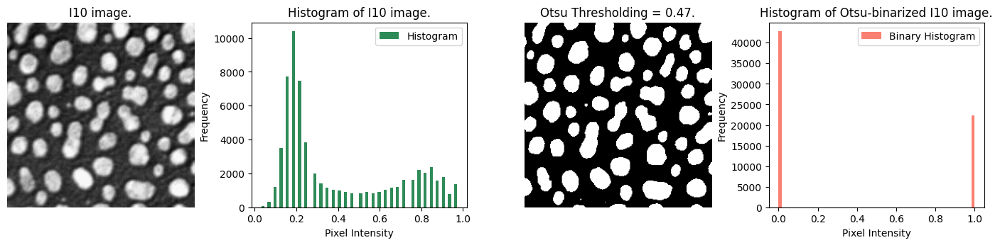

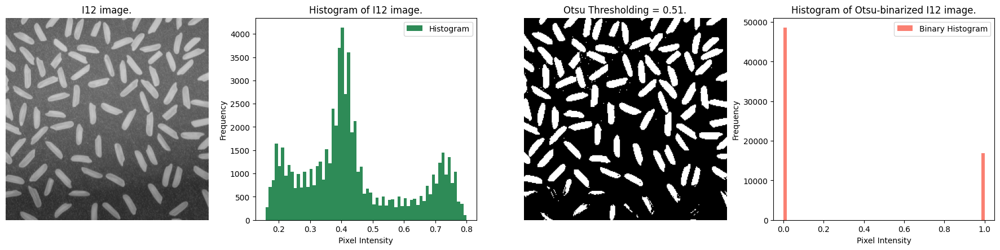

In [332]:
#Function for Otsu thresholding
def otsu_method(img):
    otsu_threshold = threshold_otsu(img)
    #Binarization
    binary_image = (img > otsu_threshold).astype(np.uint8)
    return binary_image, otsu_threshold

#List with all the images
img_list = [image_array_gdr, image_array_objects, image_array_bacteria, image_array_cell, image_array_chro, image_array_gear_wheel, image_array_fibers, image_array_fibers2, image_array_I10, image_array_I12]
#Names
image_names = ["Gdr", "Objects", "Bacteria", "Cell", "Chro", "Gear-Wheel", "Fibers", "Fibers2", "I10", "I12"]

for i, (img, name) in enumerate(zip(img_list, image_names)):
    #Original image
    plt.figure(figsize=(18, 40))
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(img, cmap='gray', norm=NoNorm())
    plt.title(f"{name} image.")
    plt.axis("off")

    #Histogram of the original image
    plt.subplot(10, 4, i * 4 + 2)
    plt.hist(img.ravel(), bins=64, color='seagreen', label="Histogram")
    plt.title(f"Histogram of {name} image.")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    #Thresholded image
    binary_img, otsu_threshold = otsu_method(img)
    #Plot
    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Otsu Thresholding = {otsu_threshold:.2f}.")
    plt.axis("off")

    #Histogram of the thresholded image
    plt.subplot(10, 4, i * 4 + 4)
    plt.hist(binary_img.ravel(), bins=64, color='salmon', label="Binary Histogram")
    plt.title(f"Histogram of Otsu-binarized {name} image.")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

plt.tight_layout()
plt.show()

##### 2.3. Histogram stretching influence 
#####  Try to segment this modified image using your own algorithm for stretching (paragraph 1.3) and its original version using Otsu’s method. Do not only compare the value but the result images. Are the comments identical using histogram equalization to modify the image? 

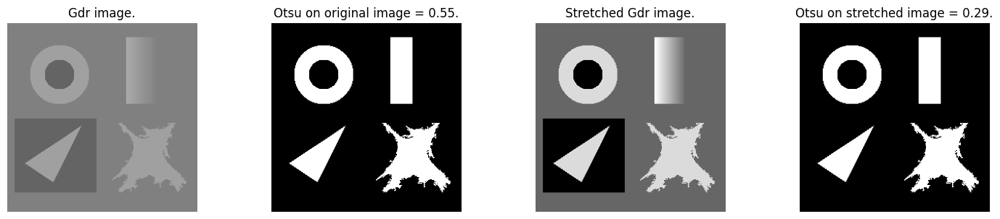

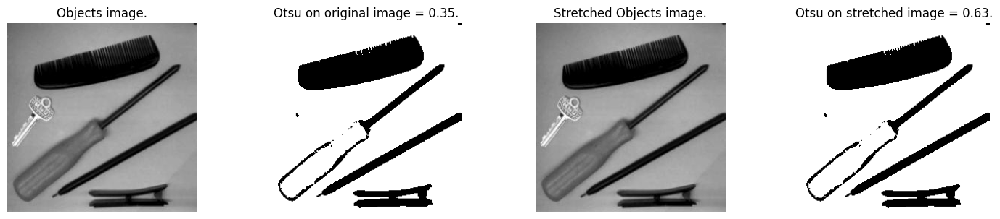

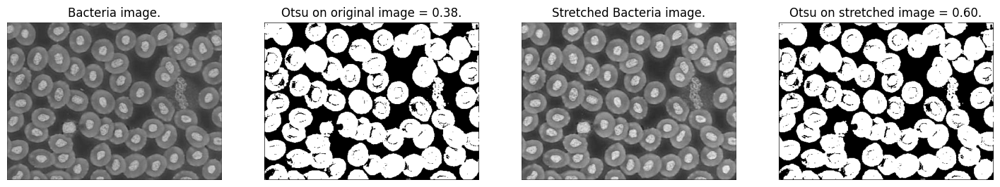

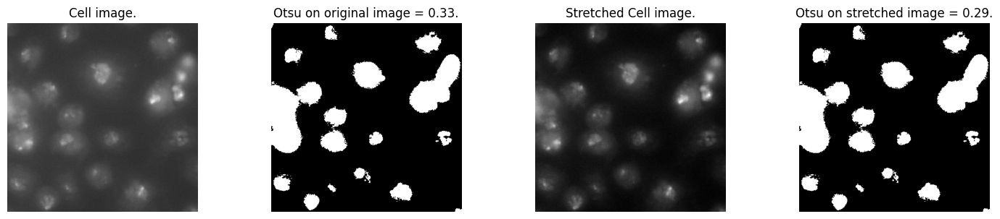

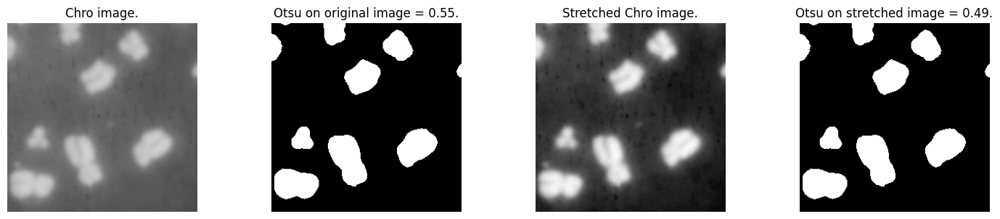

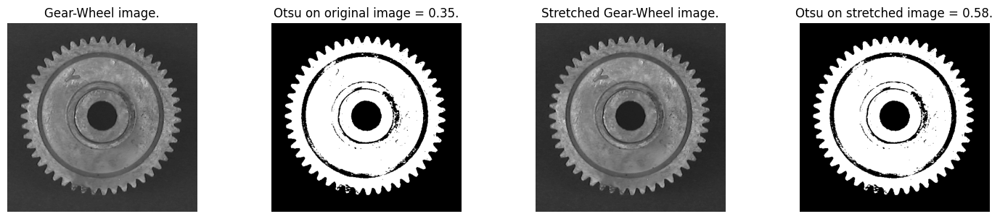

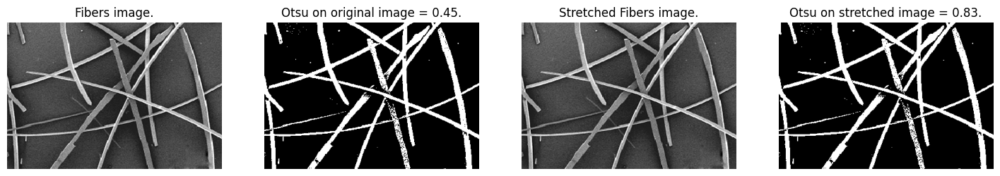

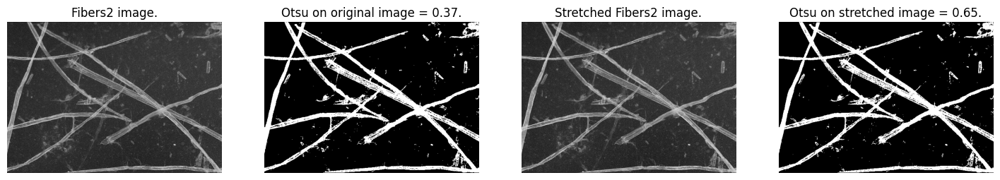

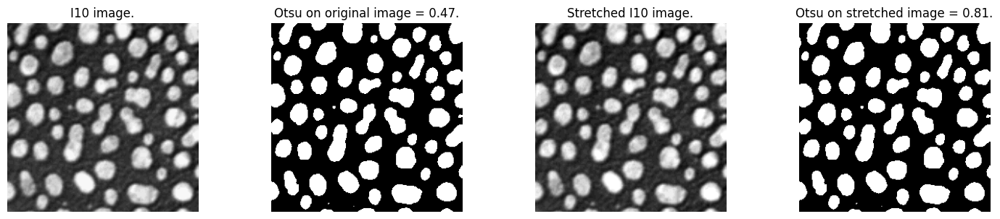

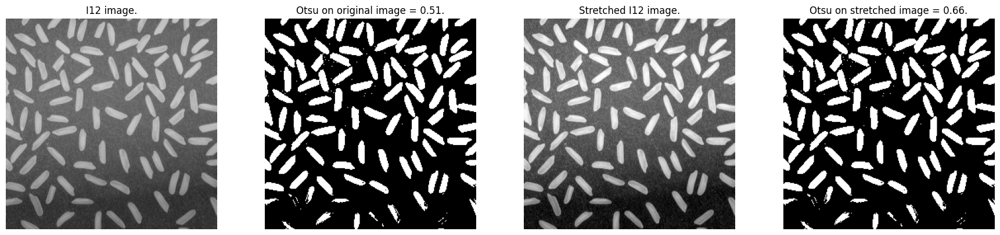

In [333]:
for i, (img, name) in enumerate(zip(img_list, image_names)):
    #Original image
    plt.figure(figsize=(18, 40))
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(img, cmap='gray', norm=NoNorm())
    plt.title(f"{name} image.")
    plt.axis("off")

    #Thresholded image on original one
    binary_img, otsu_threshold = otsu_method(img)
    #Plot
    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Otsu on original image = {otsu_threshold:.2f}.")
    plt.axis("off")

    #Stretched image
    stret_img = stretching(img)
    #Plot
    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(stret_img, cmap='gray')
    plt.title(f"Stretched {name} image.")
    plt.axis("off")

    #Thresholded image on stretched one
    stret_array_img = np.array(stret_img)/255.0
    binary_img2, otsu_threshold2 = otsu_method(stret_array_img)
    #Plot
    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(binary_img2, cmap='gray')
    plt.title(f"Otsu on stretched image = {otsu_threshold2:.2f}.")
    plt.axis("off")

plt.tight_layout()
plt.show()

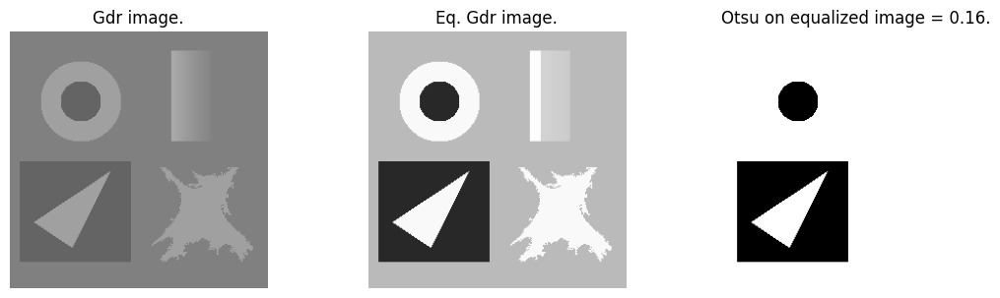

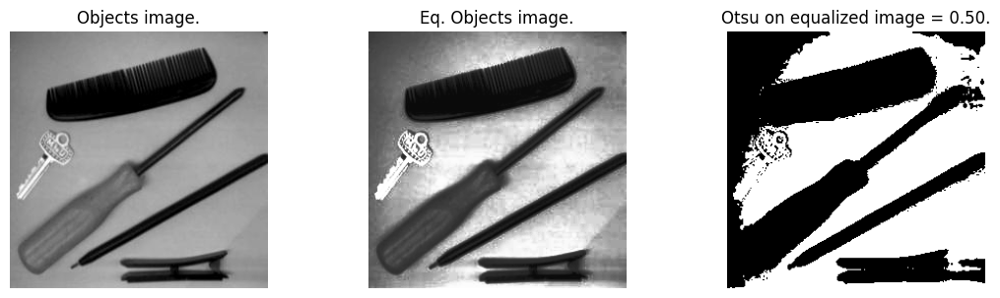

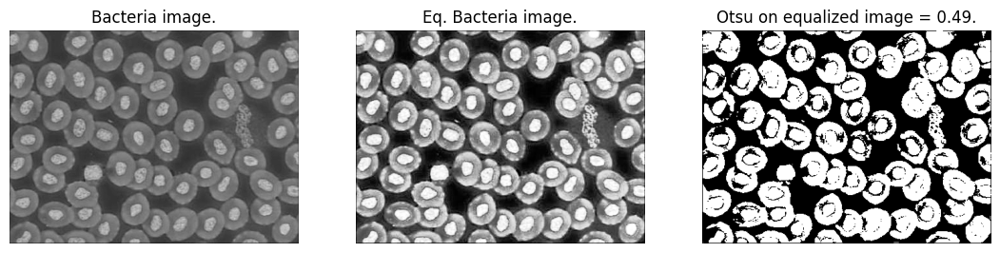

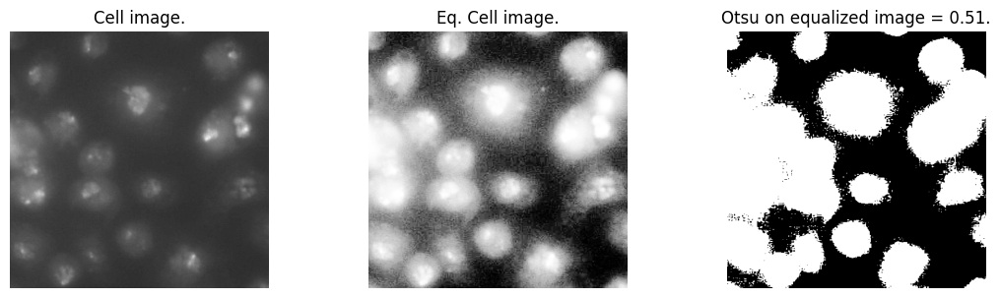

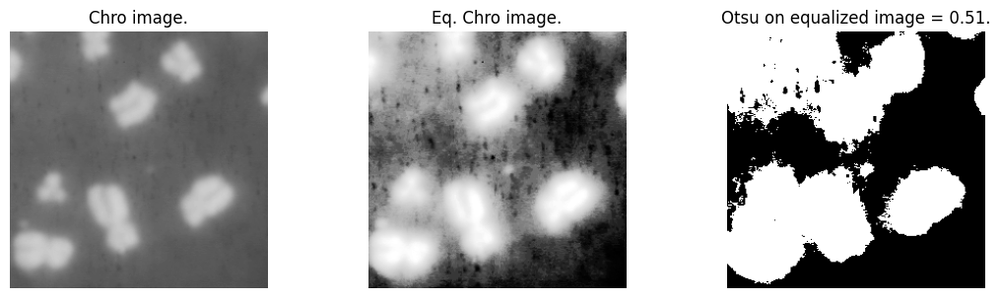

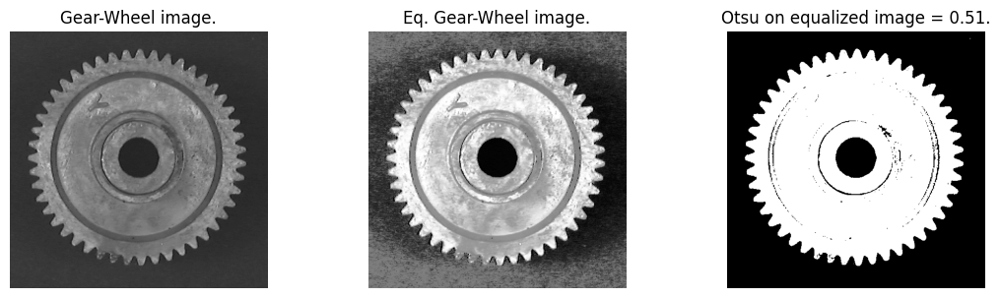

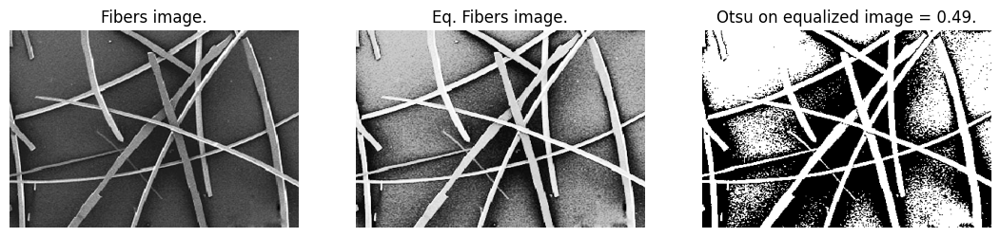

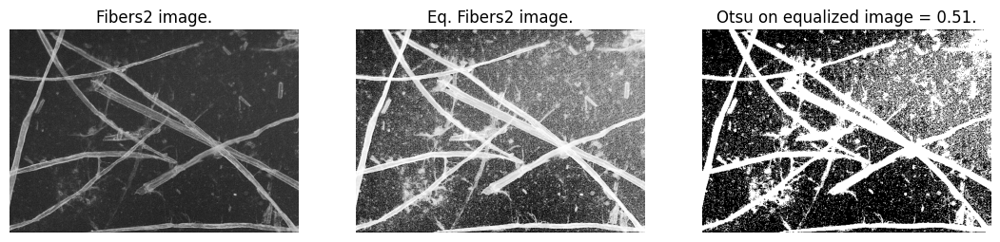

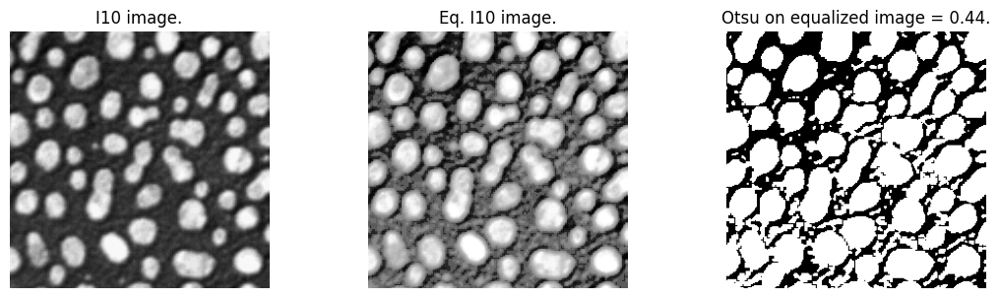

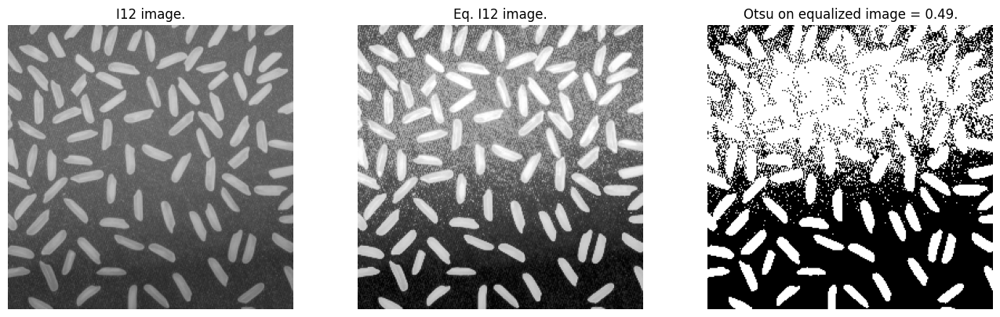

In [334]:
for i, (img, name) in enumerate(zip(img_list, image_names)):
    #Original image
    plt.figure(figsize=(18, 40))
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(img, cmap='gray', norm=NoNorm())
    plt.title(f"{name} image.")
    plt.axis("off")

    #Equalized image
    equalized_img = exposure.equalize_hist(img)
    #Plots
    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(equalized_img, cmap='gray', norm=NoNorm())
    plt.title(f"Eq. {name} image.")
    plt.axis("off")

    #Thresholded image on the equalized one
    binary_img_eq, otsu_threshold_eq = otsu_method(equalized_img)
    #Plot
    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(binary_img_eq, cmap='gray')
    plt.title(f"Otsu on equalized image = {otsu_threshold_eq:.2f}.")
    plt.axis("off")

plt.tight_layout()
plt.show()

##### 2.4. Color images 
##### Considering the image ‘pills2’, write an image processing algorithm that measures the surface area of the green pills in pixels. The pills pixels must be isolated as white pixels while the rest of the image must be colored in black. If necessary, use the hue from the hsv transform to better isolate the green color. The function is rgb2hsv in Matlab, you can use skimage.color.rgb2hsv from the skimage library. What kind of information should be needed to be able to estimate the size of each pill surface in square millimeters?

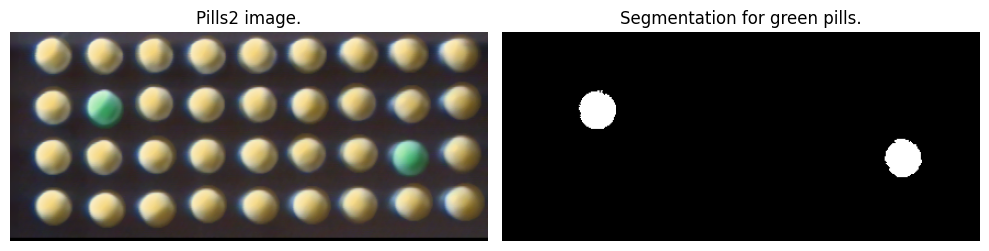

In [326]:
#Load image
image_pills2 = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\pills2.bmp")

#To array
image_array_pills2 = np.array(image_pills2)

#Conversion RGB to HSV as suggested
#- Hue: [0,1]. As hue increases from 0 to 1, the color transitions from red to orange, yellow, green, cyan, blue, magenta, and finally back to red.
#- Saturation: [0,1]. 0 = neutral shade, 1 = maximum saturation.
#- Value: maximum value among the red, green, and blue components of a specific color.
hsv_pills2 = rgb2hsv(image_array_pills2)
#Extraction of Hue and Saturation channels
hue = hsv_pills2[:, :, 0]  #Hue channel
saturation = hsv_pills2[:, :, 1]  #Saturation channel
#Thresholds for green in HSV space:
#The Hue range has 360 degrees. The color green goes more or less between 80° to 180°. Hence, 80/360 = 0.22, while 180/360 = 0.5.
lower_hue = 0.22  #Lower bound for green hue
upper_hue = 0.5  #Upper bound for green hue
minimum_saturation = 0.1  #Minimum saturation to exclude white --> 0.1 after some trials.
#Mask for green points in the image
green_mask = (hue >= lower_hue) & (hue <= upper_hue) & (saturation >= minimum_saturation)
#Removing eventual noise (if there is any)
final_mask = remove_small_objects(green_mask, min_size=200)  #min_size indicates that each object wuth an area lower than 50 pixels is removed.
#Converting the mask to binary one (black = 0 and white = 1)
binary_mask = final_mask.astype(np.uint8) * 255

#Plot
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
plt.imshow(image_pills2, cmap='gray', norm=NoNorm())
plt.title("Pills2 image.")
plt.axis("off")

#Segmentation plot
plt.subplot(1, 2, 2)
plt.imshow(binary_mask, cmap='gray')
plt.title("Segmentation for green pills.")
plt.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
#Calculation of the area in pixels
green_pixels_surface = np.sum(final_mask)
print(f"Surface of green pills: {green_pixels_surface} pixels")
#For the surface in squared millimiters we need the measure in millimiters of a single pixel.


Surface of green pills: 1806 pixels


### 3. Labeling 
##### 3.1. From now on, we would like to count the number of objects automatically, using the connected component analysis method. Taking the image ‘chro’, how to know the number of objects? Try to visualize the labeled image using directly imshow. Try to show it more distinctively with the map jet and a black background using the label2rgb function.

Number of objects found: 10


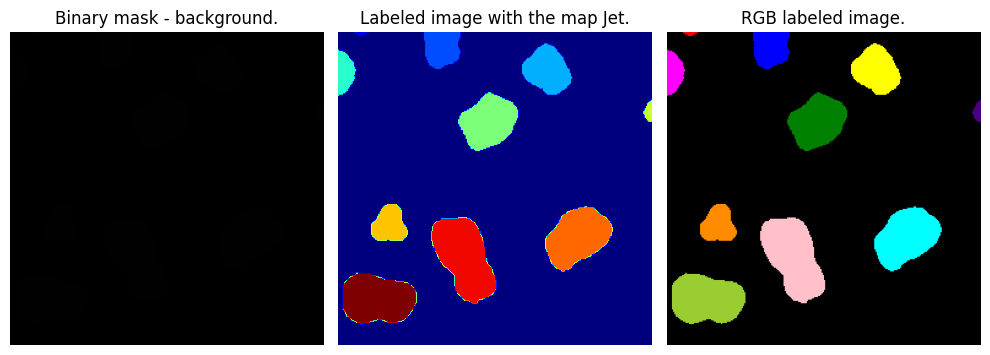

In [ ]:
#Converting inot binary image through Otsu method
binary_img_chro, otsu_thr_chro = otsu_method(image_array_chro)

#Labeling the connected components
labeled_image, num_objects = label(binary_img_chro, connectivity=2, return_num=True)

print(f"Number of objects found: {num_objects}")

#Plot
plt.figure(figsize=(10, 6))
#Binary mask - black background
plt.subplot(1, 3, 1)
plt.imshow(binary_img_chro, cmap='gray', norm=NoNorm())
plt.title("Binary mask - background.")
plt.axis("off")

#Labeled image with Jet map
plt.subplot(1, 3, 2)
plt.imshow(labeled_image, cmap='jet')
plt.title("Labeled image with the map Jet.")
plt.axis("off")

#Labeled image with label2rgb (black background)
labeled_image_rgb = label2rgb(labeled_image, bg_label=0, bg_color=(0, 0, 0), colors=None)
plt.subplot(1, 3, 3)
plt.imshow(labeled_image_rgb)
plt.title("RGB labeled image.")
plt.axis("off")

plt.tight_layout()
plt.show()

##### 3.2. Try to automatically count the number of differences between previous images ‘original’ and ‘original2’.

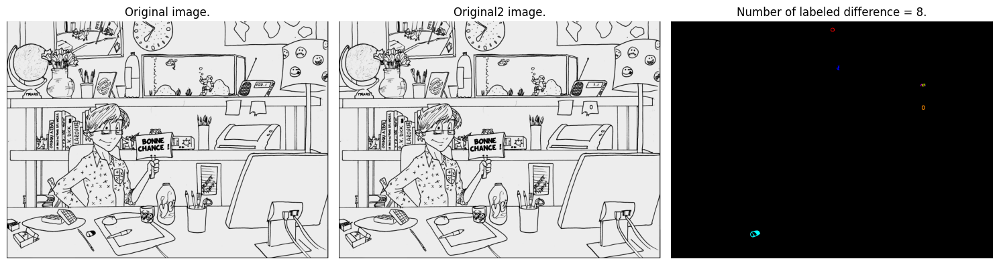

In [ ]:
#Load image
image_original = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\original.bmp")
image_original2 = Image.open("C:\\Users\\sofyc\OneDrive\\Desktop\\UPEC\\Pattern recognition\\assignment 3 - IP\\IP3\\IP3\\original2.bmp")

#To array
image_array_original = np.array(image_original)
image_array_original2 = np.array(image_original2)

#Converting inot binary image through Otsu method
binary_img_original, otsu_thr_original = otsu_method(image_array_original)
binary_img_original2, otsu_thr_original2 = otsu_method(image_array_original2)

#We calculate the difference with XOR operation
#We can't use np.diff since it calculates differences between consecutive elements in a specified axis. It is not adapt for entire images.
difference_img = np.logical_xor(binary_img_original, binary_img_original2)

#Labelling the difference
labeled_diff, num_diff = label(difference_img, connectivity=2, return_num=True)

#Plot
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(image_original, cmap='gray', norm=NoNorm())
plt.title("Original image.")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(image_original2, cmap='gray', norm=NoNorm())
plt.title("Original2 image.")
plt.axis("off")

#Plot of difference between labelling
#To RGB
labeled_diff_rgb = label2rgb(labeled_diff, bg_label=0, bg_color=(0, 0, 0), colors=None)
plt.subplot(1, 3, 3)
plt.imshow(labeled_diff_rgb)
plt.title(f"Number of labeled difference = {num_diff}.")
plt.axis("off")

plt.tight_layout()
plt.show()


In [335]:
print(num_diff)

8


## References
- https://www.youtube.com/watch?v=qe4fpdNzfxU
- https://fr.mathworks.com/help/matlab/ref/rgb2hsv.html
- https://stackoverflow.com/questions/37684903/matlab-how-to-detect-green-color-on-image